In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 16.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 64.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 35.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 43.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 16.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 54.5 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling 

In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from pathlib import Path
import time
import json
from google.colab.patches import cv2_imshow # Import cv2_imshow
import cv2
import numpy as np
import math
import os
import matplotlib.pyplot as plt
#import pytesseract
from PIL import Image
plt.style.use('dark_background')


Loading training YOLO license plate detection and Character Recognition Deep learning models

In [11]:
yolo_model = YOLO("/content/drive/MyDrive/datasets/test-yolo-2-4-annotations/bd_license_plate_detector.pt")
confidence_threshold = 0.25

from tensorflow.keras.models import load_model
from google.colab import drive

ocr_model = load_model("/content/drive/MyDrive/datasets/test-yolo-2-4-annotations/EfficientNetB0_license_plate_v2.keras")

ocr_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)     │ (None, 1280)           │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 29)             │         3,741 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 13,161,460 (50.21 MB)

 Trainable params: 4,372,889 (16.68 MB)

 Non-trainable params: 42,791 (167.16 KB)

 Optimizer params: 8,745,780 (33.36 MB)

Preprocessing and other helper functions


In [3]:
def show_img(title, img, cmap='gray'):
    plt.figure(figsize=(6, 4))
    plt.imshow(img, cmap=cmap)
    plt.title(title)
    plt.axis('off')
    plt.show()

def show(title, img, cmap='gray', size=(6, 4)):
    plt.figure(figsize=size)
    plt.title(title)
    plt.imshow(img, cmap=cmap)
    plt.axis('off')
    plt.show()

def detect_license_plates(image):
    """
    Detect license plates in an image using YOLO

    Args:
        image: Input image (numpy array or path)

    Returns:
        List of detected plate regions with coordinates
    """
    # Run YOLO inference
    results = yolo_model(image, conf=confidence_threshold)

    detected_plates = []

    for r in results:
        boxes = r.boxes
        if boxes is not None:
            for box in boxes:
                # Get coordinates
                x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                confidence = box.conf[0].cpu().numpy()

                detected_plates.append({
                    'bbox': [int(x1), int(y1), int(x2), int(y2)],
                    'confidence': float(confidence)
                })

    return detected_plates

def crop_license_plate(image, bbox, padding=10):
    """
    Crop license plate region from image with padding

    Args:
        image: Original image
        bbox: Bounding box [x1, y1, x2, y2]
        padding: Padding around the plate
    """
    x1, y1, x2, y2 = bbox
    h, w = image.shape[:2]

    # # Add padding
    # x1 = max(0, x1 - padding)
    # y1 = max(0, y1 - padding)
    # x2 = min(w, x2 + padding)
    # y2 = min(h, y2 + padding)

    # Without padding
    x1 = max(0, x1)
    y1 = max(0, y1)
    x2 = min(w, x2)
    y2 = min(h, y2)

    return image[y1:y2, x1:x2]
    # return image

def visualize_results_and_return_best_bbox(image, results):
    """
    Visualize detection and recognition results

    This returns x1 y1 x2 y2 of the best bbox
    """
    # Create a copy for visualization
    vis_image = image.copy()

    # Draw bounding boxes and text
    best_box = None
    best_det_conf = None

    for result in results:
        bbox = result['bbox']
        det_conf = result['confidence']

        if best_box is None or det_conf > best_det_conf:
            best_box = bbox
            best_det_conf = det_conf

    x1, y1, x2, y2 = best_box

    # Draw bounding box of the best
    cv2.rectangle(vis_image, (x1, y1), (x2, y2), (0, 255, 0), 2)
    cv2.putText(vis_image, str(best_det_conf), (x1, y2+20),
                cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)

    cv2_imshow(vis_image)
    return best_box

In [6]:
def unsharp_mask(image, blur_ksize=(5, 5), alpha=1.5, beta=-0.5, gamma=0):
    # Blur the image
    blurred = cv2.GaussianBlur(image, blur_ksize, 0)

    # Weighted sum: result = alpha*image + beta*blurred + gamma
    sharpened = cv2.addWeighted(image, alpha, blurred, beta, gamma)

    return sharpened

def denoise_bilateral(image):
    return cv2.bilateralFilter(image, d=9, sigmaColor=75, sigmaSpace=75)

def morphological_closing(binary_img):
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2))
    closed = cv2.morphologyEx(binary_img, cv2.MORPH_CLOSE, kernel, iterations=1)
    return closed

def find_contours(dimensions, img, original_for_draw=None):
    # Get contours
    cntrs, _ = cv2.findContours(img.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    lower_width, upper_width, lower_height, upper_height = dimensions

    # Sort by area, keep top 15 (as you did)
    cntrs = sorted(cntrs, key=cv2.contourArea, reverse=True)[:20]

    x_cntr_list = []
    target_contours = []
    img_res = []

    # Prepare image to draw bounding boxes on
    draw_img = original_for_draw.copy() if original_for_draw is not None else np.dstack([img]*3)

    for i, cntr in enumerate(cntrs):
        x, y, w, h = cv2.boundingRect(cntr)
        if cv2.contourArea(cntr) > 50:
          # Optionally filter by size, or use all
          if True:
              x_cntr_list.append(x)

              char_copy = np.ones((64, 64), dtype=np.uint8) * 255
              char = img[y:y+h, x:x+w]
              char = cv2.resize(char, (62, 62))
              char_copy[2:64, 2:64] = char

              img_res.append(char_copy)

              # Draw box on the visualization image
              cv2.rectangle(draw_img, (x, y), (x+w, y+h), (124,252,0), 2)
              cv2.putText(draw_img, str(i+1), (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (124,252,0), 1)

    # Sort by x-coord (left to right)
    indices = sorted(range(len(x_cntr_list)), key=lambda k: x_cntr_list[k])
    img_res = [img_res[idx] for idx in indices]

    # Show image with boxes once
    plt.figure(figsize=(8, 6))
    plt.imshow(draw_img)
    plt.title("All Detected Contours on Plate")
    plt.axis('off')
    plt.show()

    return img_res

def crop_borders(image, top_pct=0.05, side_pct=0.0125, bottom_pct=0.0125):
    h, w = image.shape[:2]
    top = int(h * top_pct)
    bottom = int(h * (1 - bottom_pct))
    left = int(w * side_pct)
    right = int(w * (1 - side_pct))
    return image[top:bottom, left:right]

In [7]:
def preprocess_image_otsu(img):
    # Step 1: Grayscale

    enhanced = unsharp_mask(img)
    denoised = denoise_bilateral(enhanced)
    gray = cv2.cvtColor(denoised, cv2.COLOR_BGR2GRAY)
    # show("Grayscale", gray)

    # Step 2: Contrast enhancement using morphological filters
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    top_hat = cv2.morphologyEx(gray, cv2.MORPH_TOPHAT, kernel)
    black_hat = cv2.morphologyEx(gray, cv2.MORPH_BLACKHAT, kernel)
    enhanced = cv2.add(gray, top_hat)
    enhanced = cv2.subtract(enhanced, black_hat)
    # show("Contrast Enhanced", enhanced)

    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    # show("Otsu Binary Threshold", binary)

    # Step 4: Erosion + Dilation (noise cleanup)
    binary = cv2.erode(binary, np.ones((2,2), np.uint8), iterations=1)
    binary = cv2.dilate(binary, np.ones((2,2), np.uint8), iterations=1)
    # show("After Erosion + Dilation", binary)

    return binary

def segment_characters_otsu(image):
    # Resize plate and threshold
    img_lp = cv2.resize(image, (333, 335))

    _, binary = cv2.threshold(img_lp, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    binary = cv2.erode(binary, (3,3))
    binary = cv2.dilate(binary, (3,3))

    # # Add white border
    # binary[0:3,:] = 255
    # binary[:,0:3] = 255
    # binary[332:,:] = 255
    # binary[:,330:] = 255

    dimensions = [binary.shape[0]/6, binary.shape[0]/2, binary.shape[1]/8, 2*binary.shape[1]/3]

    # Show binary image
    plt.imshow(binary, cmap='gray')
    plt.title("Binary Image Before Contours")
    plt.axis('off')
    plt.show()

    # Pass original image for drawing boxes
    return find_contours(dimensions, binary, original_for_draw=img_lp)

In [9]:
def preprocess_image_adap(img):
    # Step 1: Grayscale

    enhanced = unsharp_mask(img)
    denoised = denoise_bilateral(enhanced)
    gray = cv2.cvtColor(denoised, cv2.COLOR_BGR2GRAY)
    # show("Grayscale", gray)

    # Step 2: Contrast enhancement using morphological filters
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    top_hat = cv2.morphologyEx(gray, cv2.MORPH_TOPHAT, kernel)
    black_hat = cv2.morphologyEx(gray, cv2.MORPH_BLACKHAT, kernel)
    enhanced = cv2.add(gray, top_hat)
    enhanced = cv2.subtract(enhanced, black_hat)
    # show("Contrast Enhanced", enhanced)

    # Step 3: Thresholding
    binary = cv2.adaptiveThreshold(
      gray,
      255,
      cv2.ADAPTIVE_THRESH_GAUSSIAN_C,  # or MEAN_C
      cv2.THRESH_BINARY,
      blockSize=15,  # or 11, 21 (odd numbers only)
      C=4      # tweak this: + makes lighter, - makes darker
    )

    # _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    # show("Otsu Binary Threshold", binary)

    # Step 4: Erosion + Dilation (noise cleanup)
    binary = cv2.erode(binary, np.ones((2,2), np.uint8), iterations=1)
    binary = cv2.dilate(binary, np.ones((2,2), np.uint8), iterations=1)
    # show("After Erosion + Dilation", binary)

    return binary

def segment_characters_adap(image):
    # Resize plate and threshold
    img_lp = cv2.resize(image, (333, 335))

    binary = cv2.adaptiveThreshold(
      img_lp,
      255,
      cv2.ADAPTIVE_THRESH_GAUSSIAN_C,  # or MEAN_C
      cv2.THRESH_BINARY,
      blockSize=15,  # or 11, 21 (odd numbers only)
      C=4         # tweak this: + makes lighter, - makes darker
    )

    # _, binary = cv2.threshold(img_lp, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    binary = cv2.erode(binary, (3,3))
    binary = cv2.dilate(binary, (3,3))

    # Add white border
    binary[0:3,:] = 255
    binary[:,0:3] = 255
    binary[332:,:] = 255
    binary[:,330:] = 255

    dimensions = [binary.shape[0]/6, binary.shape[0]/2, binary.shape[1]/8, 2*binary.shape[1]/3]

    # Show binary image
    plt.imshow(binary, cmap='gray')
    plt.title("Binary Image Before Contours")
    plt.axis('off')
    plt.show()

    # Pass original image for drawing boxes
    return find_contours(dimensions, binary, original_for_draw=img_lp)

def preprocess_for_model(contour_image):
    """
    Preprocess a single contour image for inference.
    Input: 64x64 grayscale image from your contour extraction pipeline
    Output: Preprocessed image ready for model prediction
    """
    # Ensure it's the right size
    if contour_image.shape != (64, 64):
        contour_image = cv2.resize(contour_image, (64, 64))

    # Convert to 3-channel for EfficientNet
    if len(contour_image.shape) == 2:
        img_3ch = np.stack([contour_image, contour_image, contour_image], axis=-1)
    else:
        img_3ch = contour_image

    # Normalize to [0, 1]
    img_3ch = img_3ch.astype(np.float32) / 255.0

    # Add batch dimension
    img_batch = np.expand_dims(img_3ch, axis=0)

    return img_batch

Loading test image


0: 576x640 1 license_plate, 496.2ms
Speed: 6.7ms preprocess, 496.2ms inference, 1.1ms postprocess per image at shape (1, 3, 576, 640)


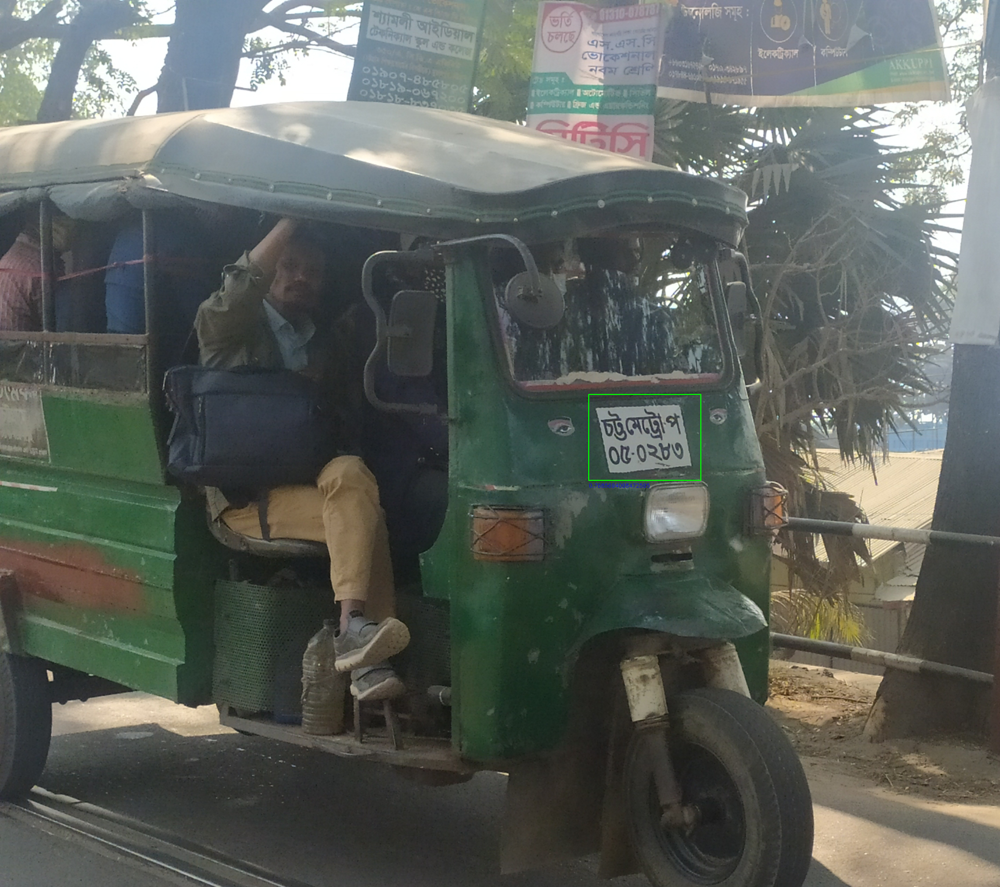

In [160]:
image_path = "/content/drive/MyDrive/datasets/test-yolo-2-4-annotations/images/Vehicle1668.jpg"

image = cv2.imread(str(image_path))

results = detect_license_plates(image)

bbox = visualize_results_and_return_best_bbox(image, results)

cropped_image = crop_license_plate(image, bbox)

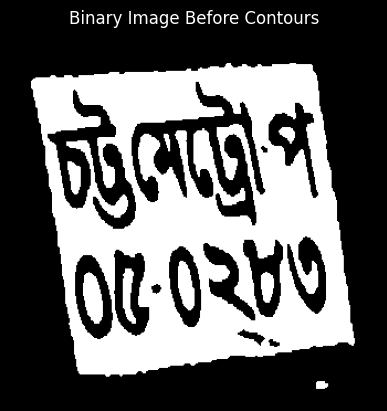

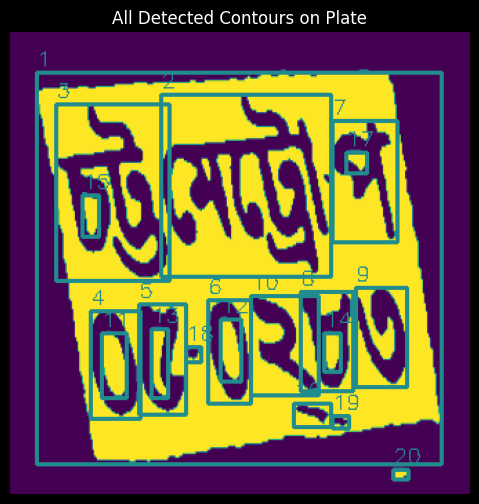

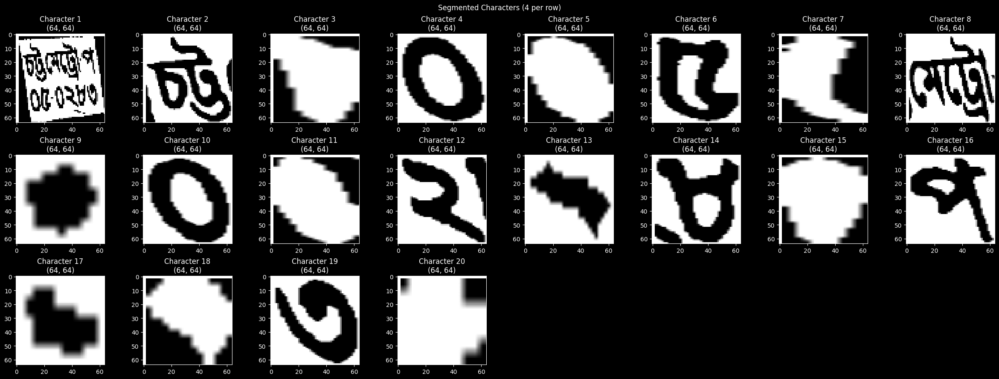

In [161]:
binary_plate_otsu = preprocess_image_otsu(cropped_image)
binary_plate_otsu = crop_borders(binary_plate_otsu)
#closed_img = morphological_closing(binary_plate)
characters_otsu = segment_characters_otsu(binary_plate_otsu)

cols = 8
rows = math.ceil(len(characters_otsu) / cols)

plt.figure(figsize=(cols * 3, rows * 3))

for i, char in enumerate(characters_otsu):
    plt.subplot(rows, cols, i + 1)
    # char = cv2.bitwise_not(char)
    plt.imshow(char, cmap='gray')
    plt.axis("on")
    plt.title(f"Character {i+1}\n{char.shape}")

plt.suptitle("Segmented Characters (4 per row)")
plt.tight_layout()
plt.show()

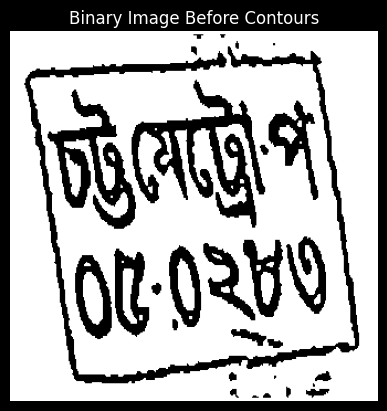

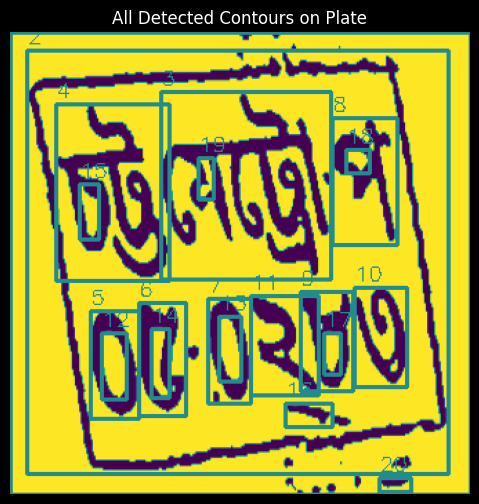

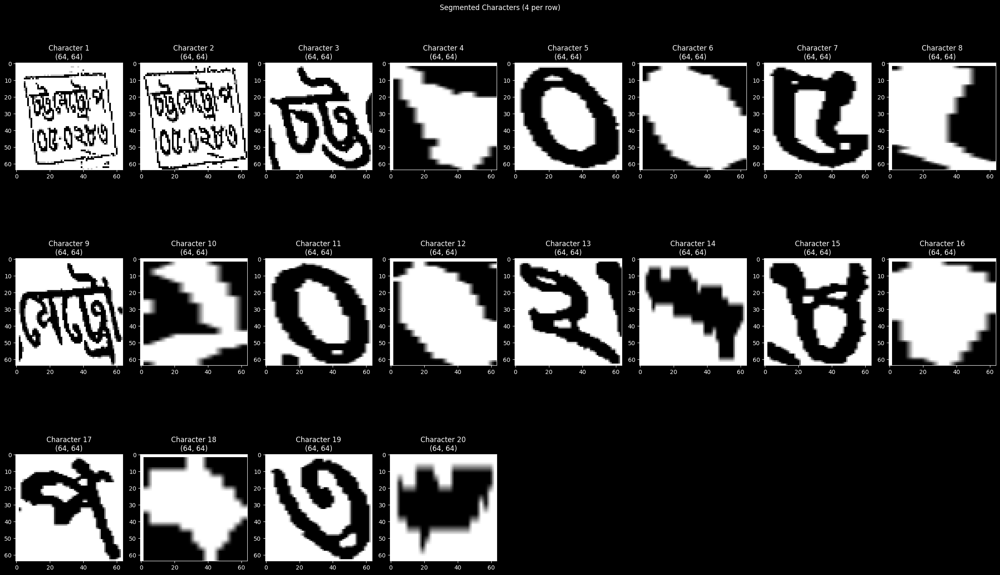

In [162]:
binary_plate_adap = preprocess_image_adap(cropped_image)
binary_plate_adap = crop_borders(binary_plate_adap)
#closed_img = morphological_closing(binary_plate)
characters_adap = segment_characters_adap(binary_plate_adap)

cols = 8
rows = math.ceil(len(characters_adap) / cols)

plt.figure(figsize=(cols * 3, rows * 5))

for i, char in enumerate(characters_adap):
    plt.subplot(rows, cols, i + 1)
    plt.imshow(char, cmap='gray')
    plt.axis("on")
    plt.title(f"Character {i+1}\n{char.shape}")

plt.suptitle("Segmented Characters (4 per row)")
plt.tight_layout()
plt.show()

In [26]:
class_names = ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'bo',
               'chattro', 'cho', 'dhaka', 'do', 'ga', 'gha', 'ho', 'kho',
               'khulna', 'ko', 'lo', 'maimanshing', 'metro', 'no', 'po',
               'sylhet', 'to', 'tto']

In [39]:
def predict_segmented_characters(segmented_images, show_samples=True, max_samples_to_show=50):
    """
    Predict on unseen segmented character images from license plates.

    Args:
        segmented_images: List or array of grayscale 64x64 images
        show_samples: Whether to visualize predictions (True/False)
        max_samples_to_show: How many images to plot if enabled

    Returns:
        predicted_classes: List of predicted class indices
        predicted_labels: List of predicted class labels (strings)
    """
    if len(segmented_images) == 0:
        print("❌ No segmented images provided.")
        return [], []

    # Preprocess all images
    processed = []
    for img in segmented_images:
        if img.shape != (64, 64):
            img = cv2.resize(img, (64, 64))
        if len(img.shape) == 2:  # Convert grayscale to 3-channel
            img = np.stack([img, img, img], axis=-1)
        img = img.astype(np.float32) / 255.0
        processed.append(img)

    X = np.array(processed)  # Shape: (N, 64, 64, 3)
    predictions = ocr_model.predict(X)
    predicted_classes = np.argmax(predictions, axis=1)
    predicted_labels = [class_names[i] for i in predicted_classes]

    # Optional visualization
    if show_samples:
      num_samples = min(max_samples_to_show, len(X))

      # Determine number of rows needed
      cols = 5
      rows = (num_samples + cols - 1) // cols  # Ceiling division

      fig, axes = plt.subplots(rows, cols, figsize=(3 * cols, 4 * rows))
      axes = axes.ravel()  # Flatten to 1D for easy indexing

      for i in range(num_samples):
          axes[i].imshow(X[i])
          axes[i].set_title(f"Pred: {predicted_labels[i]}\nConf: {predictions[i][predicted_classes[i]]:.2f}")
          axes[i].axis('off')

      # Hide any unused subplots
      for i in range(num_samples, len(axes)):
          axes[i].axis('off')

      plt.tight_layout()
      plt.show()

    return predicted_classes, predicted_labels

In [ ]:
# function to find the digits from the plate

def find_digits(char_images):
  # take an array of object that contains the predicted label and its confidence
  for label, conf in char_images:
    if label.isdigit():


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


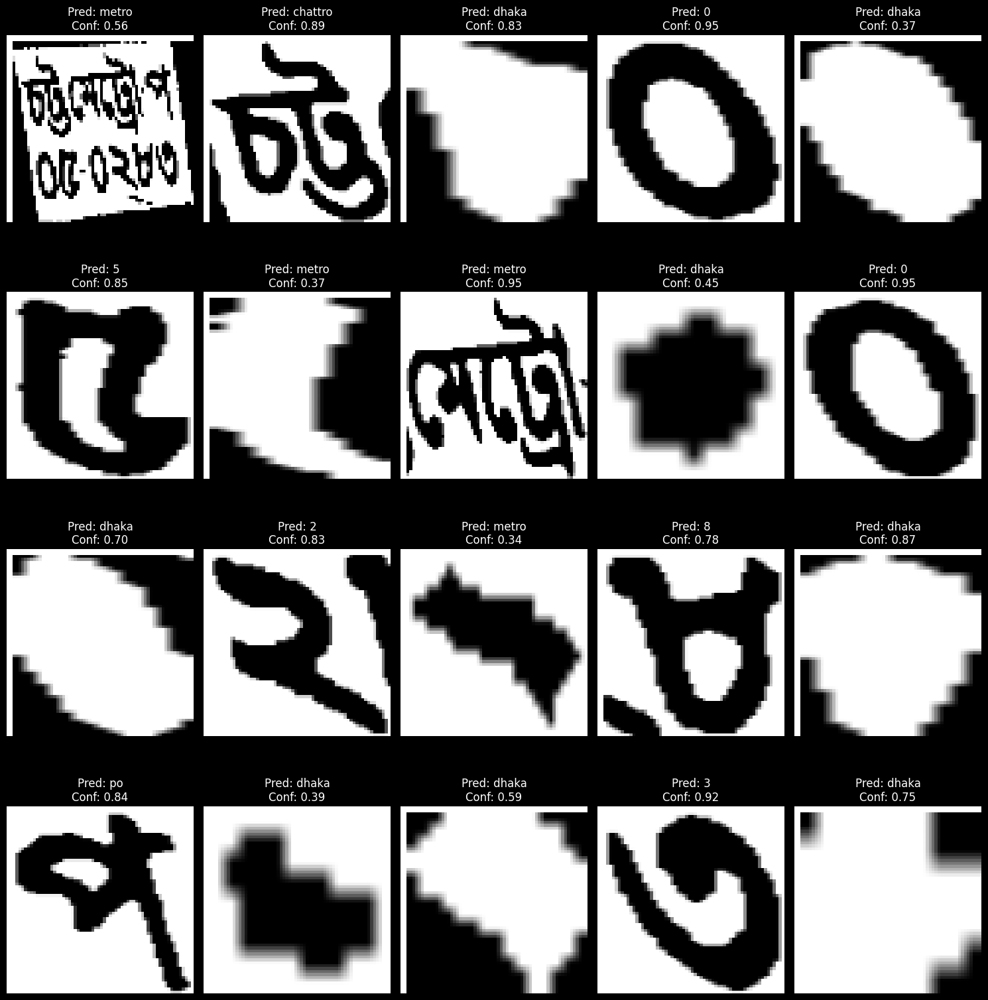

Predicted Plate: metro chattro dhaka 0 dhaka 5 metro metro dhaka 0 dhaka 2 metro 8 dhaka po dhaka dhaka 3 dhaka
Predicted labels: ['metro', 'chattro', 'dhaka', '0', 'dhaka', '5', 'metro', 'metro', 'dhaka', '0', 'dhaka', '2', 'metro', '8', 'dhaka', 'po', 'dhaka', 'dhaka', '3', 'dhaka']
Predicted indices: [23 11 13  0 13  5 23 23 13  0 13  2 23  8 13 25 13 13  3 13]


In [163]:
pred_indices, pred_labels = predict_segmented_characters(characters_otsu, show_samples=True)
plate = ' '.join(pred_labels)
print("Predicted Plate:", plate)

print("Predicted labels:", pred_labels)
print("Predicted indices:", pred_indices)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


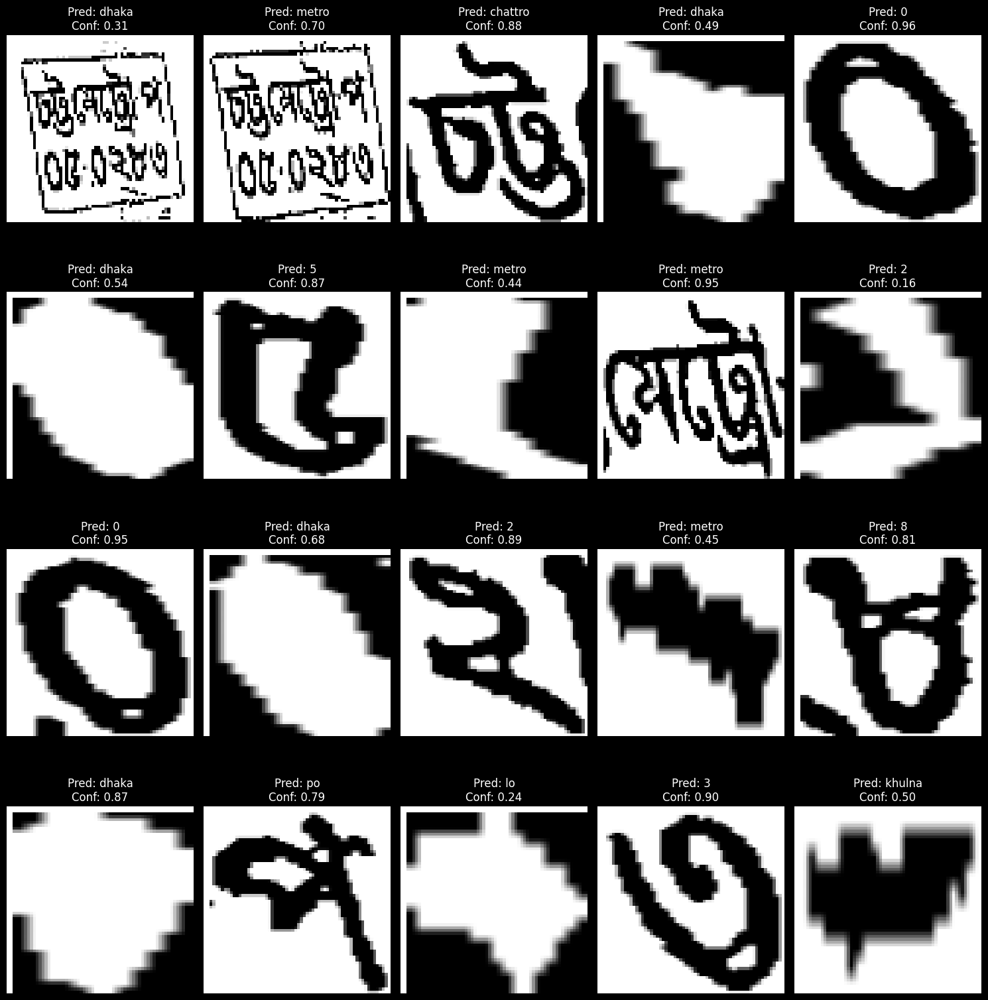

Predicted Plate: dhaka metro chattro dhaka 0 dhaka 5 metro metro 2 0 dhaka 2 metro 8 dhaka po lo 3 khulna
Predicted labels: ['dhaka', 'metro', 'chattro', 'dhaka', '0', 'dhaka', '5', 'metro', 'metro', '2', '0', 'dhaka', '2', 'metro', '8', 'dhaka', 'po', 'lo', '3', 'khulna']
Predicted indices: [13 23 11 13  0 13  5 23 23  2  0 13  2 23  8 13 25 21  3 19]


In [164]:
pred_indices, pred_labels = predict_segmented_characters(characters_adap, show_samples=True)
plate = ' '.join(pred_labels)
print("Predicted Plate:", plate)

print("Predicted labels:", pred_labels)
print("Predicted indices:", pred_indices)